# Calculate two-chain distance PMF and second osmotic virial coefficient

All analysis is done using the Plumed `.dat` files generated from MD simulations.
Before running this notebook, run `mda_data_gen.py` to convert the `.dat` files into `.parquet` files.
The script also generates system information `.json` files from the `.tpr` and `.xtc` files.

Free energy surfaces are generated through Gaussian kernel density estimation (KDE) using the `scipy` package and uncertainties are estimated using block averaging to remove internal correlations.

## Preparation

Import libraries and set up plotting parameters.

In [1]:
# Standard library
import json
import os
import re
from pathlib import Path
import sys

# Third party packages
import cmasher as cmr
import matplotlib.pyplot as plt
import MDAnalysis as mda
import numpy as np
import pandas as pd
from scipy import stats
import seaborn as sns

# get absolute path to file's parent directory
dir_proj_base = Path(os.getcwd()).resolve().parents[2]
sys.path.insert(0, f"{dir_proj_base}/src")

# Internal dependencies
from figures.style import set_style  # noqa: E402
from analysis_helpers.plumed_two_chain import prepare_data, b2_integrand, integrate_simpson # noqa: E402

In [2]:
cv = "d12"  # collective variable
set_style()

In [3]:
def natural_sort(l):
    def convert(text):
        if text.isdigit():
            return int(text)
        else:
            return text.lower()

    def alphanum_key(key):
        if type(key) is not str:
            key = str(key)
        return [convert(c) for c in re.split("([0-9]+)", key)]

    return sorted(l, key=alphanum_key)


Find the Plumed `.dat` files as well as system information JSON files generated from `mda_gen_data.ipynb`.

In [4]:
# glob directories in output
data_base_path = Path("/media/aglisman/Linux_Overflow/home/aglisman/VSCodeProjects/Gromacs-Data-Analysis/analysis/16-paper-2chain-analysis/data/mdanalysis")
data_path_1 = data_base_path / "output"
data_path_2 = data_base_path / "output_copolymer"

tag = "*16mer*"
glob1 = data_path_1.glob(tag)
glob2 = data_path_2.glob(tag)
# get list of directories
dir_list = [x for x in glob1 if x.is_dir()]
dir_list.extend([x for x in glob2 if x.is_dir()])
dir_list = natural_sort(dir_list)

print(f"Found {len(dir_list)} directories")
for i, d in enumerate(dir_list):
    print(f"{i}: {d.name}")

Found 11 directories
0: 2PAcr-16mer-0.25Ace-32Ca-0Na-hremd_wtmetad_prod-12.0nm_box-jid_2.1-idx_00
1: 2PAcr-16mer-0.25Ace-64Ca-0Na-hremd_wtmetad_prod-12.0nm_box-jid_2.2-idx_01
2: 2PAcr-16mer-0.125Ace-64Ca-0Na-hremd_wtmetad_prod-12.0nm_box-jid_3.2-idx_02
3: 2PAcr-16mer-0Ca-0Na-hremd_wtmetad_prod-12.0nm_box-jid_10071-idx_00
4: 2PAcr-16mer-8Ca-0Na-hremd_wtmetad_prod-12.0nm_box-jid_5-idx_01
5: 2PAcr-16mer-16Ca-0Na-hremd_wtmetad_prod-12.0nm_box-jid_5-idx_02
6: 2PAcr-16mer-32Ca-0Na-hremd_wtmetad_prod-12.0nm_box-jid_6-idx_03
7: 2PAcr-16mer-64Ca-0Na-hremd_wtmetad_prod-12.0nm_box-jid_6-idx_04
8: 2PAcr-16mer-128Ca-0Na-hremd_wtmetad_prod-12.0nm_box-jid_23-idx_05
9: 2PAsp-16mer-32Ca-0Na-hremd_wtmetad_prod-12.0nm_box-jid_10071-idx_00
10: 2PGlu-16mer-32Ca-0Na-hremd_wtmetad_prod-12.0nm_box-jid_10071-idx_01


In [5]:
print(f"Number of simulation data directories: {len(dir_list)}")
for i, d in enumerate(dir_list):
    print(f" - {i}: {d.name}")

# find plumed parquet file
plumed_files = [list(Path(x / "plumed/data").glob("df_plumed_2*.parquet"))[0]  for x in dir_list]

# find mdanalysis data json files
mda_info_files = [list(Path(x / "mdanalysis/data").glob("info_dict*.json"))[0]  for x in dir_list]
mda_sel_files = [list(Path(x / "mdanalysis/data").glob("sel_dict*.json"))[0]  for x in dir_list]

Number of simulation data directories: 11
 - 0: 2PAcr-16mer-0.25Ace-32Ca-0Na-hremd_wtmetad_prod-12.0nm_box-jid_2.1-idx_00
 - 1: 2PAcr-16mer-0.25Ace-64Ca-0Na-hremd_wtmetad_prod-12.0nm_box-jid_2.2-idx_01
 - 2: 2PAcr-16mer-0.125Ace-64Ca-0Na-hremd_wtmetad_prod-12.0nm_box-jid_3.2-idx_02
 - 3: 2PAcr-16mer-0Ca-0Na-hremd_wtmetad_prod-12.0nm_box-jid_10071-idx_00
 - 4: 2PAcr-16mer-8Ca-0Na-hremd_wtmetad_prod-12.0nm_box-jid_5-idx_01
 - 5: 2PAcr-16mer-16Ca-0Na-hremd_wtmetad_prod-12.0nm_box-jid_5-idx_02
 - 6: 2PAcr-16mer-32Ca-0Na-hremd_wtmetad_prod-12.0nm_box-jid_6-idx_03
 - 7: 2PAcr-16mer-64Ca-0Na-hremd_wtmetad_prod-12.0nm_box-jid_6-idx_04
 - 8: 2PAcr-16mer-128Ca-0Na-hremd_wtmetad_prod-12.0nm_box-jid_23-idx_05
 - 9: 2PAsp-16mer-32Ca-0Na-hremd_wtmetad_prod-12.0nm_box-jid_10071-idx_00
 - 10: 2PGlu-16mer-32Ca-0Na-hremd_wtmetad_prod-12.0nm_box-jid_10071-idx_01


Output files

In [6]:
dir_output_base = Path("./../output_plumed_pmf")
dir_figures = dir_output_base / "figures"
dir_data = dir_output_base / "data"

dir_figures.mkdir(exist_ok=True, parents=True)
dir_data.mkdir(exist_ok=True, parents=True)

Load Plumed parquet files into a `pandas` dataframe and system information JSON files into a dictionary.

In [7]:
# load all simulation data
data = [] * len(plumed_files)

for i in range(len(plumed_files)): 
    dct = {
        "plumed": pd.read_parquet(plumed_files[i]),
        "info": json.load(open(mda_info_files[i])),
        "sel": json.load(open(mda_sel_files[i]))
    }
    data.append(dct)


## Analysis

### Plot the two chain distance PMF

#### PAA Homopolymer

In [8]:
# data analysis parameters
block_size = 5000
n_pts = 2000
bandwidth = 0.08
t_min = 1000 # ps
r_min_data = 0.3
r_min = 0.2
r_max = 5.0
r_plateau = [4.0, 5.0]
z_score = 1.96
error_bars = True

In [9]:
# compute simulation indices for homopolymer PAA
skip_tags = ["Ace-", "Alc-", "PAsp-", "PGlu-"]

idxs_plot = []
for i in range(len(data)):
    tag = plumed_files[i].stem
    if any(x in tag for x in skip_tags):
        continue
    idxs_plot.append(i)

Number of lines to plot: 6
Plotting data for 11 simulations
3: Simulation tag: df_plumed_2PAcr-16mer-0Ca-0Na-hremd_wtmetad_prod-12.0nm_box-jid_10071-idx_00
 - Figure label: 0
 - Number of input data points: 254341
 - Number of blocks: 50


 - Minimum of pmf [nm]: 2.00
 - Nearest times to minimum [ps]: [42118. 60737. 47822.]
4: Simulation tag: df_plumed_2PAcr-16mer-8Ca-0Na-hremd_wtmetad_prod-12.0nm_box-jid_5-idx_01
 - Figure label: 8
 - Number of input data points: 251120
 - Number of blocks: 50
 - Minimum of pmf [nm]: 1.24
 - Nearest times to minimum [ps]: [ 91900.  92197. 216007.]
5: Simulation tag: df_plumed_2PAcr-16mer-16Ca-0Na-hremd_wtmetad_prod-12.0nm_box-jid_5-idx_02
 - Figure label: 16
 - Number of input data points: 263186
 - Number of blocks: 52
 - Minimum of pmf [nm]: 0.39
 - Nearest times to minimum [ps]: [27735. 24793. 24020.]
6: Simulation tag: df_plumed_2PAcr-16mer-32Ca-0Na-hremd_wtmetad_prod-12.0nm_box-jid_6-idx_03
 - Figure label: 32
 - Number of input data points: 260475
 - Number of blocks: 52
 - Minimum of pmf [nm]: 0.90
 - Nearest times to minimum [ps]: [217602. 194050. 193416.]
7: Simulation tag: df_plumed_2PAcr-16mer-64Ca-0Na-hremd_wtmetad_prod-12.0nm_box-jid_6-idx_04
 - Figure label: 64
 - Number o

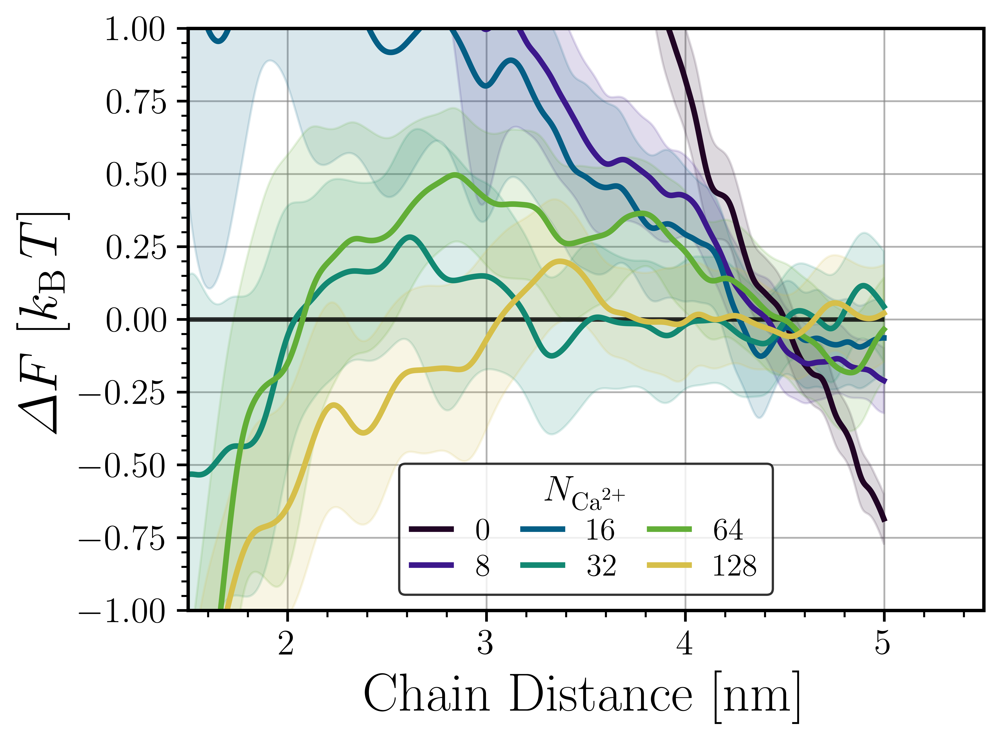

In [10]:
# plotting parameters
n_lines = len(idxs_plot)
print(f"Number of lines to plot: {n_lines}")
cmap = cmr.take_cmap_colors("cmr.rainforest", N=n_lines, cmap_range=(0.10, 0.80))
linestyle = ["-"] * n_lines

# create figure
fig = plt.figure(dpi=1200)
ax = fig.add_subplot(111)

# grid and lines
ax.grid(which="major", axis="both", linestyle="-", color="gray", alpha=0.6)
# ax.grid(which="minor", axis="both", linestyle="--", linewidth=0.5, color="gray", alpha=0.4)
ax.hlines(0, r_min, r_max, linestyle="-", color="k", alpha=0.8)

# output data
print(f"Plotting data for {len(data)} simulations")

for idx_absolute, idx_plot in enumerate(idxs_plot):
    nca = f"{data[idx_plot]['info']['n_Ca']}"
    tag = plumed_files[idx_plot].stem

    label = f"{nca}"
    df = data[idx_plot]["plumed"].copy()
    # drop data before t_min
    df = df[df["time"] >= t_min]
    
    print(f"{idx_plot}: Simulation tag: {tag}")
    print(f" - Figure label: {label}")
    print(f" - Number of input data points: {df.shape[0]}")
    print(f" - Number of blocks: {int(data[idx_plot]['plumed'].shape[0] / block_size)}")

    # calculate pmf
    r, pmf, err = prepare_data(df, "d12", 
                               block_size=block_size, n_pts=n_pts, 
                               kde=True, bandwidth=bandwidth, x_min_data=r_min_data,
                               volume_correction_plumed=True, pmf=True,
                               integrand=False, integral=False)
    # drop data out of range
    idx_keep = (r <= r_max) & (r >= r_min)
    r = r[idx_keep]
    pmf = pmf[idx_keep]
    err = err[idx_keep]
    # set pmf zero to average in plateau region
    idx_plateau = (r >= r_plateau[0]) & (r <= r_plateau[1])
    pmf -= np.mean(pmf[idx_plateau])

    # find minimum of pmf
    rm = r[r < 2.0][np.argmin(pmf[r < 2.0])]
    print(f" - Minimum of pmf [nm]: {rm:.2f}")
    # find n closest indices of "d12" to r_min and return time column
    n = 3
    idx = np.argsort(np.abs(df["d12"] - rm))[:n]
    tm = df.iloc[idx]["time"]
    print(f" - Nearest times to minimum [ps]: {tm.values}")

    # plot pmf
    ax.plot(r, pmf, label=label, color=cmap[idx_absolute], linestyle=linestyle[idx_absolute], linewidth=2.5)
    if error_bars:
        ax.fill_between(r, pmf - z_score * err, pmf + z_score * err,
                        color=cmap[idx_absolute], alpha=0.15)
    

# plot formatting
ax.set_xlabel("Chain Distance [nm]")
ax.set_xlim(0.2, 4.)
ax.set_ylabel(r"$\Delta F$ [$k_\mathrm{B} \, T$]")
ax.set_ylim(-5, 15)
ax.set_title(f"Two-Chain PAA Homopolymer", y=1.03)
ax.legend(loc="upper right", title=r"$N_{\mathrm{Ca}^{2+}}$", ncol=1, frameon=True)
fig.tight_layout()

# save figure
fig.savefig(dir_figures / f"pmf_paa_homopolymer_errors_{error_bars}.png", transparent=True, dpi=600)

# remove title and save figure
ax.set_title("")
fig.tight_layout()
fig.savefig(dir_figures / f"pmf_paa_homopolymer_errors_{error_bars}.pdf", transparent=True, dpi=1200)

# create zoomed figure
ax.set_xlim(0.2, 3.0)
ax.set_ylim(-5, 5)
fig.tight_layout()
fig.savefig(dir_figures / f"pmf_paa_homopolymer_errors_{error_bars}_zoom.pdf", transparent=True, dpi=1200)

# create plateau figure
ax.set_xlim(1.5, 5.5)
ax.set_ylim(-1, 1)
fig.tight_layout()
ax.legend(loc="lower center", title=r"$N_{\mathrm{Ca}^{2+}}$", ncol=3, frameon=True)
fig.savefig(dir_figures / f"pmf_paa_homopolymer_errors_{error_bars}_plateau.pdf", transparent=True, dpi=1200)


#### PAA Copolymer

In [11]:
# compute simulation indices for copolymer PAA
skip_tags = ["PAsp-", "PGlu-", "0Ca-", "8Ca-", "16Ca-", "128Ca-"]

idxs_plot = []
for i in range(len(data)):
    tag = plumed_files[i].stem
    if any(x in tag for x in skip_tags):
        continue
    idxs_plot.append(i)

# sort by number of Ca2+ ions
idxs_plot = np.array(idxs_plot)[np.argsort([int(data[i]["info"]["n_Ca"]) for i in idxs_plot])]


print(f"Number of lines to plot: {len(idxs_plot)}")
for i, t in enumerate(idxs_plot):
    print(f"{i}: {plumed_files[t].stem}")


Number of lines to plot: 5
0: df_plumed_2PAcr-16mer-0.25Ace-32Ca-0Na-hremd_wtmetad_prod-12.0nm_box-jid_2.1-idx_00
1: df_plumed_2PAcr-16mer-32Ca-0Na-hremd_wtmetad_prod-12.0nm_box-jid_6-idx_03
2: df_plumed_2PAcr-16mer-0.25Ace-64Ca-0Na-hremd_wtmetad_prod-12.0nm_box-jid_2.2-idx_01
3: df_plumed_2PAcr-16mer-0.125Ace-64Ca-0Na-hremd_wtmetad_prod-12.0nm_box-jid_3.2-idx_02
4: df_plumed_2PAcr-16mer-64Ca-0Na-hremd_wtmetad_prod-12.0nm_box-jid_6-idx_04


In [12]:
cmap = cmr.take_cmap_colors("cmr.rainforest", N=6, cmap_range=(0.10, 0.80))
colors = [
    cmap[3], # 32 Ca, 25% Acetate
    cmap[3], # 32 Ca
    cmap[4], # 64 Ca, 25% Acetate
    cmap[4], # 64 Ca, 12.5% Acetate
    cmap[4], # 64 Ca
]
lines = ["dashed", "solid", "dashed", "dotted", "solid"]

assert len(colors) == len(lines)
assert len(colors) == len(idxs_plot)

0: Simulation tag: df_plumed_2PAcr-16mer-0.25Ace-32Ca-0Na-hremd_wtmetad_prod-12.0nm_box-jid_2.1-idx_00
 - Figure label: 32, 0.250
 - Number of input data points: 283996
 - Number of blocks: 56
6: Simulation tag: df_plumed_2PAcr-16mer-32Ca-0Na-hremd_wtmetad_prod-12.0nm_box-jid_6-idx_03
 - Figure label: 32
 - Number of input data points: 260475
 - Number of blocks: 52
1: Simulation tag: df_plumed_2PAcr-16mer-0.25Ace-64Ca-0Na-hremd_wtmetad_prod-12.0nm_box-jid_2.2-idx_01
 - Figure label: 64, 0.250
 - Number of input data points: 296654
 - Number of blocks: 59
2: Simulation tag: df_plumed_2PAcr-16mer-0.125Ace-64Ca-0Na-hremd_wtmetad_prod-12.0nm_box-jid_3.2-idx_02
 - Figure label: 64, 0.125
 - Number of input data points: 296623
 - Number of blocks: 59
7: Simulation tag: df_plumed_2PAcr-16mer-64Ca-0Na-hremd_wtmetad_prod-12.0nm_box-jid_6-idx_04
 - Figure label: 64
 - Number of input data points: 282246
 - Number of blocks: 56


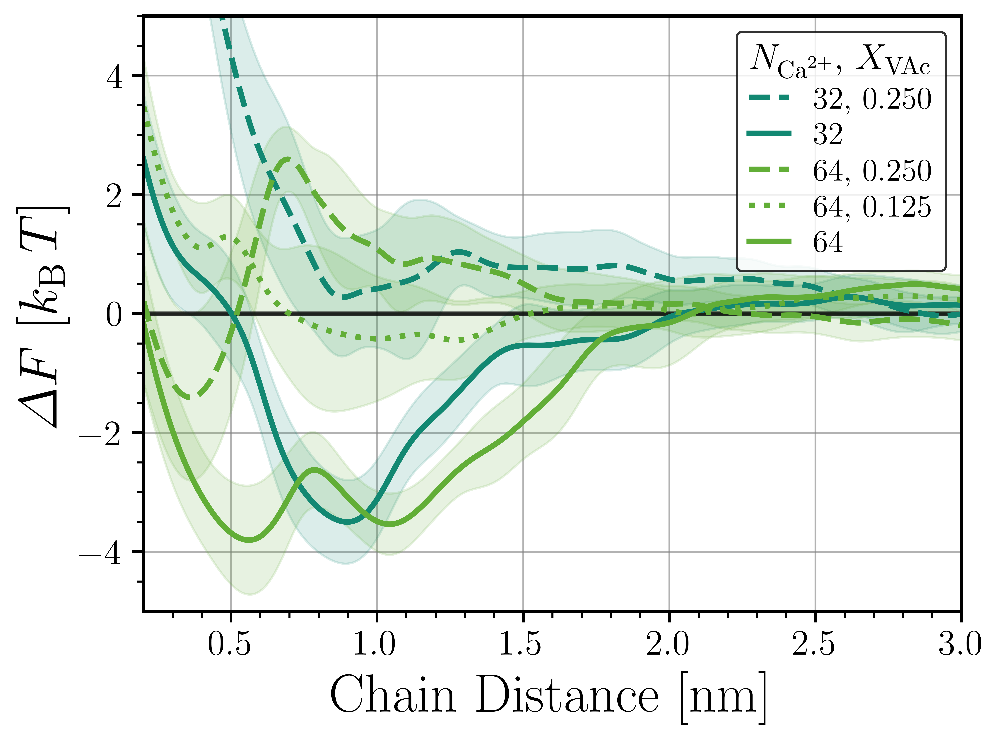

In [13]:
# create figure
fig = plt.figure(dpi=1200)
ax = fig.add_subplot(111)

# grid and lines
ax.grid(which="major", axis="both", linestyle="-", color="gray", alpha=0.6)
# ax.grid(which="minor", axis="both", linestyle="--", linewidth=0.5, color="gray", alpha=0.4)
ax.hlines(0, r_min, r_max, linestyle="-", color="k", alpha=0.8)

for idx_absolute, idx_plot in enumerate(idxs_plot):
    tag = plumed_files[idx_plot].stem

    # get % acetate
    try:
        perc_mon_vac = float(re.findall(r"0.\d+(?=Ace)", tag)[0])
    except IndexError:
        perc_mon_vac = 0.
    
    # get number of Ca
    nca = f"{data[idx_plot]['info']['n_Ca']}"

    # set plot label
    if perc_mon_vac == 0.:
        label = f"{nca}"
    else:
        label = f"{nca}, {perc_mon_vac:0.3f}"
    
    df = data[idx_plot]["plumed"].copy()
    df = df[df["time"] >= t_min]
    print(f"{idx_plot}: Simulation tag: {tag}")
    print(f" - Figure label: {label}")
    print(f" - Number of input data points: {df.shape[0]}")
    print(f" - Number of blocks: {int(data[idx_plot]['plumed'].shape[0] / block_size)}")

    # calculate pmf
    r, pmf, err = prepare_data(df, "d12", 
                               block_size=block_size, n_pts=n_pts, 
                               kde=True, bandwidth=bandwidth, x_min_data=r_min_data,
                               volume_correction_plumed=True, pmf=True,
                               integrand=False, integral=False)
    # drop data out of range
    idx_keep = (r <= r_max) & (r >= r_min)
    r = r[idx_keep]
    pmf = pmf[idx_keep]
    err = err[idx_keep]
    # set pmf zero to average in plateau region
    idx_plateau = (r >= r_plateau[0]) & (r <= r_plateau[1])
    pmf -= np.mean(pmf[idx_plateau])

    # plot pmf
    ax.plot(r, pmf,
            label=label, color=colors[idx_absolute],
            linestyle=lines[idx_absolute], linewidth=2.5)
    if error_bars:
        ax.fill_between(r, pmf - z_score * err, pmf + z_score * err,
                        color=colors[idx_absolute], alpha=0.15)
    

# plot formatting
ax.set_xlabel("Chain Distance [nm]")
ax.set_xlim(0.2, 3)
ax.set_ylabel(r"$\Delta F$ [$k_\mathrm{B} \, T$]")
ax.set_ylim(-5, 5)
ax.set_title(f"Two-Chain PAA Copolymer", y=1.03)
ax.legend(loc="upper right", title=r"$N_{\mathrm{Ca}^{2+}}$, $X_\mathrm{VAc}$", ncol=1, frameon=True)
fig.tight_layout()

# save figure
fig.savefig(dir_figures / f"pmf_paa_copolymer_errors_{error_bars}.png", transparent=True, dpi=600)

# remove title and save figure
ax.set_title("")
fig.tight_layout()
fig.savefig(dir_figures / f"pmf_paa_copolymer_errors_{error_bars}.pdf", transparent=True, dpi=1200)

#### Alternative monomer chemistry

In [14]:
# compute simulation indices for copolymer PAA
skip_tags = ["0Ca-", "8Ca-", "16Ca-", "64Ca-", "128Ca-", "Ace-", "Alc-"]

idxs_plot = []
for i in range(len(data)):
    tag = plumed_files[i].stem
    if any(x in tag for x in skip_tags):
        continue
    idxs_plot.append(i)

# sort by number of Ca2+ ions
idxs_plot = np.array(idxs_plot)[np.argsort([int(data[i]["info"]["n_Ca"]) for i in idxs_plot])]


print(f"Number of lines to plot: {len(idxs_plot)}")
for i, t in enumerate(idxs_plot):
    print(f"{i}: {plumed_files[t].stem}")


Number of lines to plot: 3
0: df_plumed_2PAcr-16mer-32Ca-0Na-hremd_wtmetad_prod-12.0nm_box-jid_6-idx_03
1: df_plumed_2PAsp-16mer-32Ca-0Na-hremd_wtmetad_prod-12.0nm_box-jid_10071-idx_00
2: df_plumed_2PGlu-16mer-32Ca-0Na-hremd_wtmetad_prod-12.0nm_box-jid_10071-idx_01


In [15]:
cmap = cmr.take_cmap_colors("cmr.rainforest", N=6, cmap_range=(0.10, 0.80))
color_asp = cmr.take_cmap_colors("cmr.rainforest", 4)[0]
color_glu = cmr.take_cmap_colors("cmr.rainforest", 4)[2]
colors = [
    cmap[3], # 32 Ca
    color_asp,
    color_glu,
]
lines = ["solid"] * 3

assert len(colors) == len(lines)
assert len(colors) == len(idxs_plot)

6: Simulation tag: df_plumed_2PAcr-16mer-32Ca-0Na-hremd_wtmetad_prod-12.0nm_box-jid_6-idx_03
 - Figure label: 32, Acrylate
 - Number of input data points: 260475
 - Number of blocks: 52
9: Simulation tag: df_plumed_2PAsp-16mer-32Ca-0Na-hremd_wtmetad_prod-12.0nm_box-jid_10071-idx_00
 - Figure label: 32, Aspartate
 - Number of input data points: 257220
 - Number of blocks: 51
10: Simulation tag: df_plumed_2PGlu-16mer-32Ca-0Na-hremd_wtmetad_prod-12.0nm_box-jid_10071-idx_01
 - Figure label: 32, Glutamate
 - Number of input data points: 254523
 - Number of blocks: 51


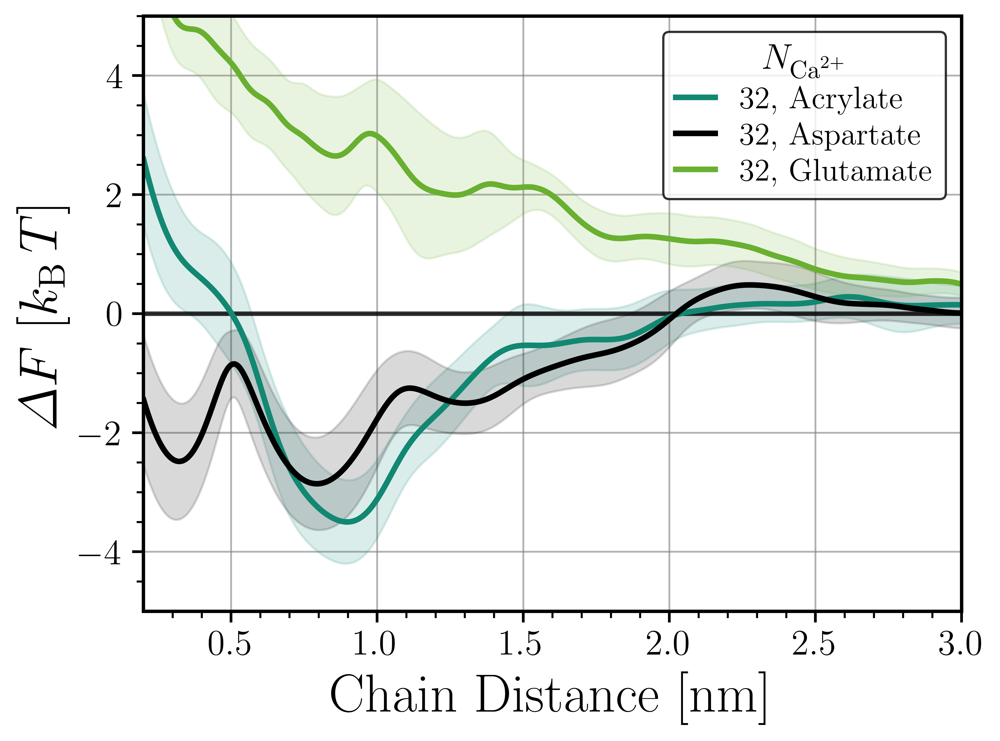

In [16]:
# create figure
fig = plt.figure(dpi=1200)
ax = fig.add_subplot(111)

# grid and lines
ax.grid(which="major", axis="both", linestyle="-", color="gray", alpha=0.6)
# ax.grid(which="minor", axis="both", linestyle="--", linewidth=0.5, color="gray", alpha=0.4)
ax.hlines(0, r_min, r_max, linestyle="-", color="k", alpha=0.8)

for idx_absolute, idx_plot in enumerate(idxs_plot):
    tag = plumed_files[idx_plot].stem
    
    # get number of Ca
    nca = f"{data[idx_plot]['info']['n_Ca']}"
    # get monomer type with P before and - after
    mon_type = re.findall(r"(?<=P)\w+(?=-)", tag)[0]
    if mon_type == "Asp":
        monomer = "Aspartate"
    elif mon_type == "Glu":
        monomer = "Glutamate"
    else:
        monomer = "Acrylate"

    label = f"{nca}, {monomer}"

    df = data[idx_plot]["plumed"].copy()
    df = df[df["time"] >= t_min]
    print(f"{idx_plot}: Simulation tag: {tag}")
    print(f" - Figure label: {label}")
    print(f" - Number of input data points: {df.shape[0]}")
    print(f" - Number of blocks: {int(data[idx_plot]['plumed'].shape[0] / block_size)}")

    # calculate pmf
    r, pmf, err = prepare_data(df, "d12", 
                               block_size=block_size, n_pts=n_pts, 
                               kde=True, bandwidth=bandwidth, x_min_data=r_min_data,
                               volume_correction_plumed=True, pmf=True,
                               integrand=False, integral=False)
    # drop data out of range
    idx_keep = (r <= r_max) & (r >= r_min)
    r = r[idx_keep]
    pmf = pmf[idx_keep]
    err = err[idx_keep]
    # set pmf zero to average in plateau region
    idx_plateau = (r >= r_plateau[0]) & (r <= r_plateau[1])
    pmf -= np.mean(pmf[idx_plateau])

    # plot pmf
    ax.plot(r, pmf,
            label=label, color=colors[idx_absolute],
            linestyle=lines[idx_absolute], linewidth=2.5)
    if error_bars:
        ax.fill_between(r, pmf - z_score * err, pmf + z_score * err,
                        color=colors[idx_absolute], alpha=0.15)
    

# plot formatting
ax.set_xlabel("Chain Distance [nm]")
ax.set_xlim(0.2, 3)
ax.set_ylabel(r"$\Delta F$ [$k_\mathrm{B} \, T$]")
ax.set_ylim(-5, 5)
ax.set_title(f"Two-Chain Homopolymers", y=1.03)
ax.legend(loc="upper right", title=r"$N_{\mathrm{Ca}^{2+}}$", ncol=1, frameon=True)
fig.tight_layout()

# save figure
fig.savefig(dir_figures / f"pmf_chemistry_errors_{error_bars}.png", transparent=True, dpi=600)

# remove title and save figure
ax.set_title("")
fig.tight_layout()
fig.savefig(dir_figures / f"pmf_chemistry_errors_{error_bars}.pdf", transparent=True, dpi=1200)

#### Find minima within the PMF

Cutting off PMF at 1 kT

0: Simulation tag: df_plumed_2PAcr-16mer-0.25Ace-32Ca-0Na-hremd_wtmetad_prod-12.0nm_box-jid_2.1-idx_00
Number of crossings: 2
Crossings: [0.         0.74137069]

1: Simulation tag: df_plumed_2PAcr-16mer-0.25Ace-64Ca-0Na-hremd_wtmetad_prod-12.0nm_box-jid_2.2-idx_01
Number of crossings: 2
Crossings: [0.23111556 0.49524762]
Number of crossings above 0.8: 0
Crossings above 0.8: []

2: Simulation tag: df_plumed_2PAcr-16mer-0.125Ace-64Ca-0Na-hremd_wtmetad_prod-12.0nm_box-jid_3.2-idx_02
Number of crossings: 2
Crossings: [0.         0.60630315]
Number of crossings above 0.8: 0
Crossings above 0.8: []

3: Simulation tag: df_plumed_2PAcr-16mer-0Ca-0Na-hremd_wtmetad_prod-12.0nm_box-jid_10071-idx_00
Number of crossings: 2
Crossings: [0.         1.84892446]

4: Simulation tag: df_plumed_2PAcr-16mer-8Ca-0Na-hremd_wtmetad_prod-12.0nm_box-jid_5-idx_01
Number of crossings: 2
Crossings: [1.05352676 1.62681341]

5: Simulation tag: df_plumed_2PAcr-16mer-16Ca-0Na-hremd_wtmetad_prod

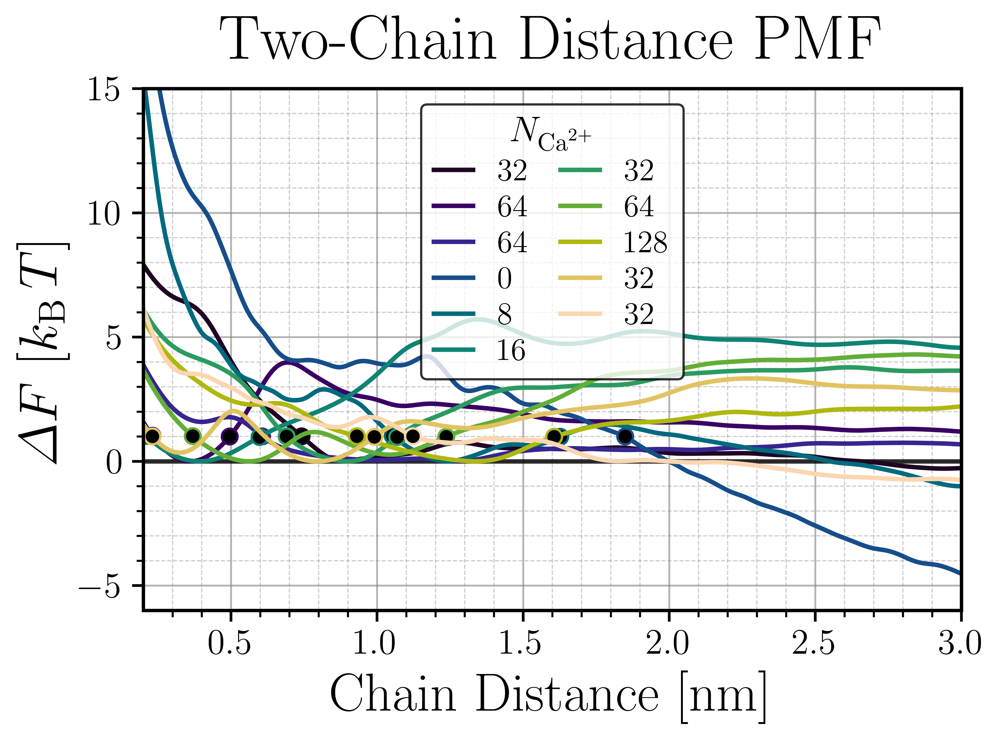

In [17]:
cmap = cmr.take_cmap_colors("cmr.rainforest", N=len(data), cmap_range=(0.10, 0.90))
linestyle = ["-"] * len(data)


pmf_cutoff = 1
print(f"Cutting off PMF at {pmf_cutoff} kT")
print()

# create figure
fig = plt.figure(dpi=1200)
ax = fig.add_subplot(111)

# grid and lines
ax.grid(which="major", axis="both", linestyle="-", color="gray", alpha=0.6)
ax.grid(which="minor", axis="both", linestyle="--", linewidth=0.5, color="gray", alpha=0.4)
ax.hlines(0, r_min, r_max, linestyle="-", color="k", alpha=0.8)

# output data
dmin = np.zeros(len(data))
dmax = np.zeros(len(data))

for i in range(len(data)):
    label = f"{data[i]['info']['n_Ca']}"
    tag = plumed_files[i].stem
    print(f"{i}: Simulation tag: {tag}")

    # calculate pmf
    r, pmf, err = prepare_data(data[i]["plumed"], "d12", 
                               block_size=block_size, n_pts=n_pts, 
                               kde=True, bandwidth=bandwidth, x_min_data=r_min_data,
                               volume_correction_plumed=True, pmf=True, integrand=False, integral=False)
    # drop data out of range
    idx_keep = (r <= r_max) & (r >= r_min)
    r = r[idx_keep]
    pmf = pmf[idx_keep]
    err = err[idx_keep]
    # set pmf zero to average in plateau region
    idx_plateau = (r >= r_plateau[0]) & (r <= r_plateau[1])
    pmf -= np.mean(pmf[idx_plateau])
    # set minima to zero in region of interest
    pmf -= np.nanmin(pmf[(r >= 0.2) & (r <= 2)])
    
    # plot pmf
    ax.plot(r, pmf, label=label, color=cmap[i], linestyle=linestyle[i])
    # ax.fill_between(r, pmf - z_score * err, pmf + z_score * err,
    #                 color=cmap[i], alpha=0.15)
   
    # find zeros of pmf
    pmf -= pmf_cutoff
    crossing = np.where(np.diff(np.sign(pmf)))
    x_cutoff = r[crossing]
    
    # if 3 crossings, drop the last one
    if len(x_cutoff) == 3:
        crossing = crossing[0][:-1]
        x_cutoff = x_cutoff[:-1]
    # if 4 crossings, drop the middle two
    elif len(x_cutoff) == 4:
        crossing = crossing[0][[0, -1]]
        x_cutoff = x_cutoff[[0, -1]]
    # if 1 crossing, add zeroith point at r=0
    elif len(x_cutoff) == 1:
        crossing = np.insert(crossing[0], 0, 0)
        x_cutoff = np.insert(x_cutoff, 0, 0)
    
    print(f"Number of crossings: {len(x_cutoff)}")
    print(f"Crossings: {x_cutoff}")

    # if nCa=64, find relative minimum above x=0.8
    if data[i]["info"]["n_Ca"] == 64:
        idx_subset = (r >= 0.8)
        idx_min = np.where(pmf[idx_subset] == np.nanmin(pmf[idx_subset]))[0][0]
        pmf_subset = pmf - pmf[idx_subset][idx_min] - pmf_cutoff
        crossing_subset = np.where(np.diff(np.sign(pmf_subset)))[0][2:]
        x_cutoff_subset = r[crossing_subset]
        print(f"Number of crossings above 0.8: {len(x_cutoff_subset)}")
        print(f"Crossings above 0.8: {x_cutoff_subset}")
        ax.plot(x_cutoff_subset, pmf[crossing_subset] + pmf_cutoff, "ko",
                markersize=7, markeredgecolor=cmap[i])

    # plot crossings as black dots
    print()
    ax.plot(x_cutoff, pmf[crossing] + pmf_cutoff, "ko",
            markersize=7, markeredgecolor=cmap[i])

# plot formatting
ax.set_xlabel("Chain Distance [nm]")
ax.set_xlim(0.2, 3.0)
ax.set_ylabel(r"$\Delta F$ [$k_\mathrm{B} \, T$]")
ax.set_ylim(-6, 15)
ax.set_title(f"Two-Chain Distance PMF", y=1.03)
ax.legend(loc="best", title=r"$N_{\mathrm{Ca}^{2+}}$", ncol=2, frameon=True)
fig.tight_layout()


In [18]:
print(f"Minimum distances:\n{dmin}")
print(f"Maximum distances:\n{dmax}")

Minimum distances:
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
Maximum distances:
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


### Plot the second osmotic virial coefficient and the calcium tolerance

0: Simulation tag: df_plumed_2PAcr-16mer-0.25Ace-32Ca-0Na-hremd_wtmetad_prod-12.0nm_box-jid_2.1-idx_00
 - Figure label: 32, 0.250
 - Number of input data points: 284896
 - Number of blocks: 56
b2 = 23.382 +/- 0.169 [nm^3./#]
prefactor = -8.303e-01

1: Simulation tag: df_plumed_2PAcr-16mer-0.25Ace-64Ca-0Na-hremd_wtmetad_prod-12.0nm_box-jid_2.2-idx_01
 - Figure label: 64, 0.250
 - Number of input data points: 297554
 - Number of blocks: 59
b2 = -3.343 +/- 0.146 [nm^3./#]
prefactor = -8.303e-01
rho_pe = 0.248 +/- 0.011

2: Simulation tag: df_plumed_2PAcr-16mer-0.125Ace-64Ca-0Na-hremd_wtmetad_prod-12.0nm_box-jid_3.2-idx_02
 - Figure label: 64, 0.125
 - Number of input data points: 297523
 - Number of blocks: 59
b2 = 11.617 +/- 0.112 [nm^3./#]
prefactor = -8.303e-01

3: Simulation tag: df_plumed_2PAcr-16mer-0Ca-0Na-hremd_wtmetad_prod-12.0nm_box-jid_10071-idx_00
 - Figure label: 0, 0.000
 - Number of input data points: 254341
 - Number of blocks: 50
b2 = 103.434 +/- 0.598 [nm^3./#]
prefactor

/tmp/ipykernel_480257/1851227803.py:161: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  fig.savefig(dir_figures / "b2_vs_distance_all.png")
/tmp/ipykernel_480257/1851227803.py:162: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  fig.savefig(dir_figures / "b2_vs_distance_all.pdf", transparent=True, dpi=1200)
/home/aglisman/miniconda3/envs/analysis/lib/python3.10/site-packages/IPython/core/events.py:89: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  func(*args, **kwargs)
/home/aglisman/miniconda3/envs/analysis/lib/python3.10/site-packages/IPython/core/pylabtools.py:152: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  fig.canvas.print_figure(bytes_io, *

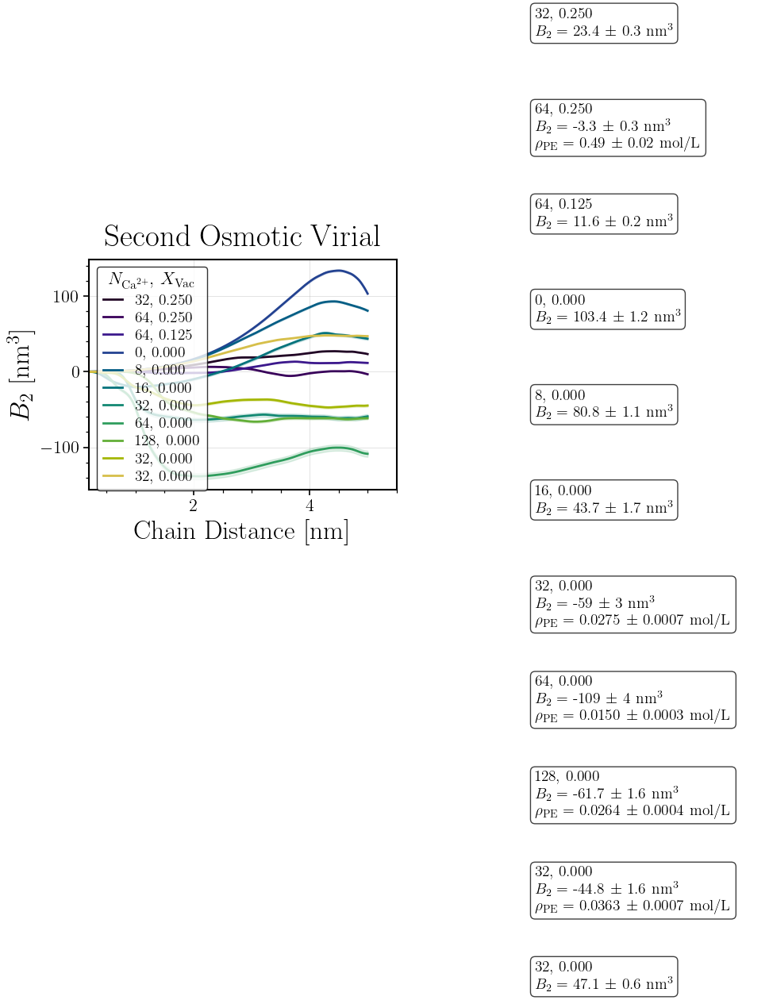

In [29]:
# b2 text label
y_text_initial = 1.5
y_text_step = 0.26


# count number of lines to plot
n_lines = len(data)
# plotting parameters
cmap = cmr.take_cmap_colors("cmr.rainforest", N=n_lines, cmap_range=(0.10, 0.80))
linestyle = ["-"] * n_lines

# make figure
fig = plt.figure(figsize=(11, 6))

# plot of B2 vs distance integrated
ax = fig.add_subplot(1, 2, 1)
ax.set_box_aspect(0.75)
ax.grid(visible=True, which="major",
        linestyle="-", linewidth=0.5, alpha=0.5)

# separate subplot for text labels
ax_text = fig.add_subplot(1, 2, 2)
# ax_text.set_box_aspect(0.75)
ax_text.axis("off")

b2_data = []
b2s, b2s_err, rhos, rhos_err, nCas, perc_vac, monomers = [], [], [], [], [], [], []

idx_line = 0
for i in range(len(data)):

    nca = f"{data[i]['info']['n_Ca']}"
    tag = plumed_files[i].stem
    try:
        perc_mon_vac = float(re.findall(r"0.\d+(?=Ace)", tag)[0])
    except IndexError:
        perc_mon_vac = 0
    perc_vac.append(perc_mon_vac)
    
    # get monomer type with P before and - after
    mon_type = re.findall(r"(?<=P)\w+(?=-)", tag)[0]
    if mon_type == "Asp":
        monomer = "Aspartate"
    elif mon_type == "Glu":
        monomer = "Glutamate"
    else:
        monomer = "Acrylate"
    monomers.append(monomer)
    
    label = f"{nca}, {perc_mon_vac:0.3f}"
    
    print(f"{i}: Simulation tag: {tag}")
    print(f" - Figure label: {label}")
    print(f" - Number of input data points: {data[i]['plumed'].shape[0]}")
    print(f" - Number of blocks: {int(data[i]['plumed'].shape[0] / block_size)}")

    nCas.append(int(data[i]["info"]["n_Ca"]))

    # calculate pmf
    r, pmf, err = prepare_data(data[i]["plumed"], "d12", 
                               block_size=block_size, n_pts=n_pts, 
                               kde=True, bandwidth=bandwidth, x_min_data=r_min_data,
                               volume_correction_plumed=True, pmf=True, integrand=False, integral=False)
    
    # drop data out of range
    idx_keep = (r <= r_max) & (r >= r_min)
    r = r[idx_keep]
    pmf = pmf[idx_keep]
    err = err[idx_keep]
    # set pmf zero to average in plateau region
    idx_plateau = (r >= r_plateau[0]) & (r <= r_plateau[1])
    pmf -= np.mean(pmf[idx_plateau])

    # convert pmf to B2 integrand
    integrand, err = b2_integrand(r, pmf, err)
    # integrate to calculate B2
    b2 = np.zeros_like(r)
    b2_err = np.zeros_like(r)
    for j in range(3, len(r)):
        val, er = integrate_simpson(r[:j], integrand[:j], err[:j], prefactor=-2*np.pi)
        b2[j] = val
        b2_err[j] = er

    # remove first three points
    r = r[3:]
    b2 = b2[3:]
    b2_err = b2_err[3:]
    # save r, b2, and err to dict
    b2_data.append({
        "r": r,
        "b2": b2,
        "err": b2_err})
    
    # get final b2 estimate
    b2_est, b2_est_err = b2[-1], b2_err[-1]
    print(f"b2 = {b2_est:.3f} +/- {b2_est_err:.3f} [nm^3./#]")
    
    # convert b2 to critical polymer chain density
    avo = 6.02216e23 # number/mol
    nm3_to_liter = 1.0e24 # nm^3/liter
    prefactor = -(nm3_to_liter / avo) / 2.0
    print(f"prefactor = {prefactor:.3e}")
    rho_pe =  prefactor / b2_est # mol/L
    rho_pe_err = np.abs(rho_pe) * np.abs(b2_est_err/b2_est)

    # REVIEW: multiply by number of monomers to get critical monomer density
    # rho_pe *= 2*16
    # rho_pe_err *= 2*16

    if b2_est < 0:
        print(f"rho_pe = {rho_pe:.3f} +/- {rho_pe_err:.3f}")

    # output b2 estimate to text axis
    try:
        sig_fig_b2 = max(int(np.ceil(np.log10(1/b2_est_err))), 0)
    except ValueError:
        sig_fig_b2 = 1
    b2_label = f"$B_2 = $ {b2_est:.{sig_fig_b2}f} $\pm$ {1.96*b2_est_err:.{sig_fig_b2}f} nm$^3$"
    if b2_est < 0:
        sig_fig_rho_pe = max(int(np.ceil(np.log10(1/rho_pe_err))), 0)
        rho_pe_label = f"$\\rho_{{\\mathrm{{PE}}}} = $ {1.96*rho_pe:.{sig_fig_rho_pe}f} $\pm$ {1.96*rho_pe_err:.{sig_fig_rho_pe}f} mol/L"
        text = f"{label}\n{b2_label}\n{rho_pe_label}"
    else:
        text = f"{label}\n{b2_label}"   
    
    # plot text label
    ax_text.text(0.25, y_text_initial, text, ha="left", va="top",
                 bbox=dict(boxstyle="round", alpha=0.75, facecolor="w"))
    y_text_initial -= y_text_step

    # plot B2 vs distance
    ax.plot(r, b2, label=label, color=cmap[idx_line], linestyle=linestyle[idx_line])
    ax.fill_between(r, b2 - z_score * b2_err, b2 + z_score * b2_err,
                    color=cmap[idx_line], alpha=0.15)
    idx_line += 1   

    # append data for other plots
    b2s.append(b2_est)
    b2s_err.append(b2_est_err)
    rhos.append(rho_pe)
    rhos_err.append(rho_pe_err)
    print()
    
# convert to numpy arrays
nCas = np.array(nCas)
b2s = np.array(b2s)
b2s_err = np.array(b2s_err)
rhos = np.array(rhos)
rhos_err = np.array(rhos_err)

# plot formatting
ax.set_xlabel("Chain Distance [nm]")
ax.set_xlim(0.2, 5.5)
ax.set_ylabel(r"$B_2$ [nm$^3$]")
# ax.set_ylim(0, 0.5)
ax.set_title(f"Second Osmotic Virial", y=1.03)
ax.legend(loc="upper left", title=r"$N_{\mathrm{Ca}^{2+}}, \, X_{\mathrm{Vac}}$", ncol=1)
# fig.tight_layout()

# save figure
fig.savefig(dir_figures / "b2_vs_distance_all.png")
fig.savefig(dir_figures / "b2_vs_distance_all.pdf", transparent=True, dpi=1200)

# convert data to df
df_b2 = pd.DataFrame({
    "monomer": monomers,
    "nCa": nCas,
    "perc_vac": perc_vac,
    "b2": b2s,
    "b2_err": b2s_err,
    "rho": rhos,
    "rho_err": rhos_err,
})

In [30]:
df_b2

,monomer,nCa,perc_vac,b2,b2_err,rho,rho_err
0,Acrylate,32,0.250,23.382484,0.169476,-0.035508,0.000257
1,Acrylate,64,0.250,-3.342653,0.146021,0.248386,0.010851
2,Acrylate,64,0.125,11.616905,0.111766,-0.071471,0.000688
3,Acrylate,0,0.000,103.434392,0.598433,-0.008027,0.000046
4,Acrylate,8,0.000,80.790323,0.563284,-0.010277,0.000072
5,Acrylate,16,0.000,43.688674,0.881696,-0.019004,0.000384
6,Acrylate,32,0.000,-59.134546,1.538802,0.014040,0.000365
7,Acrylate,64,0.000,-108.690244,2.098045,0.007639,0.000147
8,Acrylate,128,0.000,-61.655097,0.834253,0.013466,0.000182
9,Aspartate,32,0.000,-44.822372,0.804963,0.018523,0.000333


In [31]:
df_b2_homopolymer = df_b2[(df_b2["perc_vac"] == 0.0) & (df_b2["monomer"] == "Acrylate")].copy()
df_b2_copolymer = df_b2[(df_b2["perc_vac"] != 0.0) & (df_b2["monomer"] == "Acrylate")].copy()
df_b2_chemistry = df_b2[(df_b2["perc_vac"] == 0.0) & (df_b2["nCa"] == 32)].copy()


Plotting B2 vs number of Ca ions...
 - Number of homopolymer data points: 5


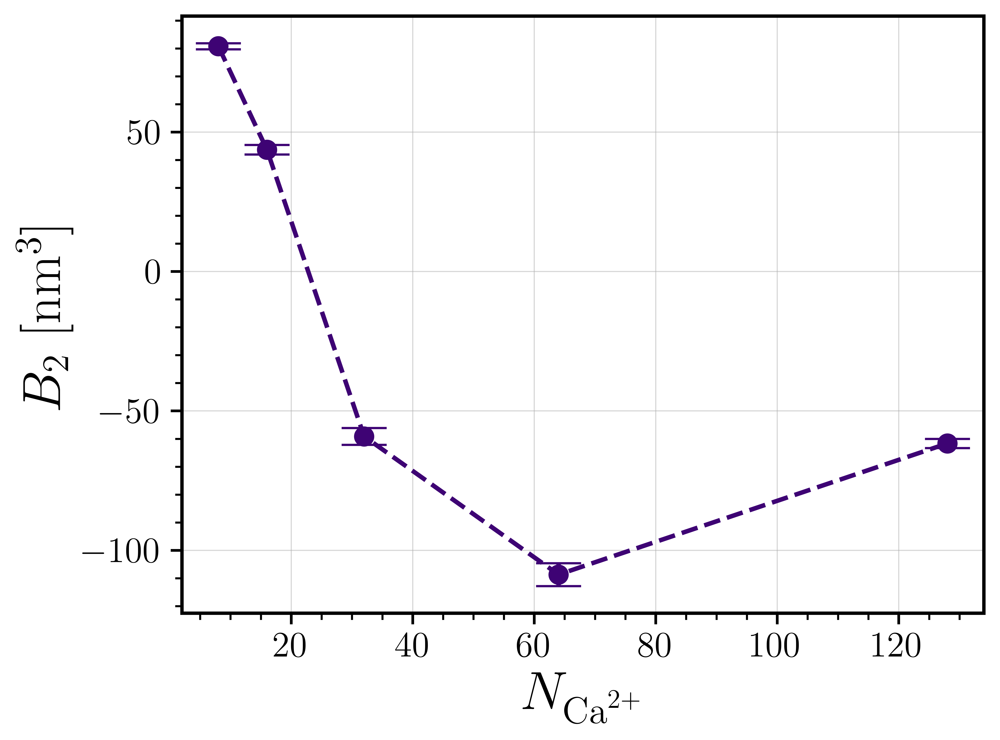

In [32]:
cmap = cmr.take_cmap_colors("cmr.rainforest", N=3, cmap_range=(0.20, 0.80))

# plot of B2 vs number of Ca ions
print("Plotting B2 vs number of Ca ions...")
fig_ca = plt.figure(dpi=1200)
ax_ca = fig_ca.add_subplot(111)
ax_ca.grid(visible=True, which="major",
           linestyle="-", linewidth=0.5, alpha=0.5)

# add horizontal line at y=0
# ax_ca.hlines(0, 0, 132, linestyle="-", color="k", alpha=0.9)

# plot B2 vs number of Ca ions for homopolymer
df = df_b2_homopolymer.loc[(df_b2_homopolymer["perc_vac"] == 0.) & (df_b2_homopolymer["nCa"] > 0)].copy()
print(f" - Number of homopolymer data points: {len(df)}")
ax_ca.errorbar(df["nCa"], df["b2"], yerr=z_score*df["b2_err"],
               linestyle="--", fmt="o", markersize=8, capsize=10,
               color=cmap[0], label="0")
multiple = False

# plot elements
ax_ca.set_xlabel(r"$N_{\mathrm{Ca}^{2+}}$")
ax_ca.set_ylabel(r"$B_2$ [nm$^3$]")
if multiple:
    ax_ca.legend(loc="best", title=r"$X_{\mathrm{VAc}}$", ncol=1)
ax_ca.set_title(r"PAA 16-mer $B_2$ vs. $N_{\mathrm{Ca}^{2+}}$", y=1.03)
fig_ca.tight_layout()

# save figure
fig_ca.savefig(dir_figures / "b2_vs_nca_paa_hompolymer.png", transparent=True, dpi=600)

# remove title and save as PDF
ax_ca.set_title("")
fig_ca.tight_layout()
fig_ca.savefig(dir_figures / "b2_vs_nca_paa_homopolymer.pdf", transparent=True, dpi=1200)


Plotting B2 vs number of Ca ions...
 - Number of homopolymer data points: 5
 - Number of 12.5% copolymer data points: 1
 - Number of 25% copolymer data points: 2


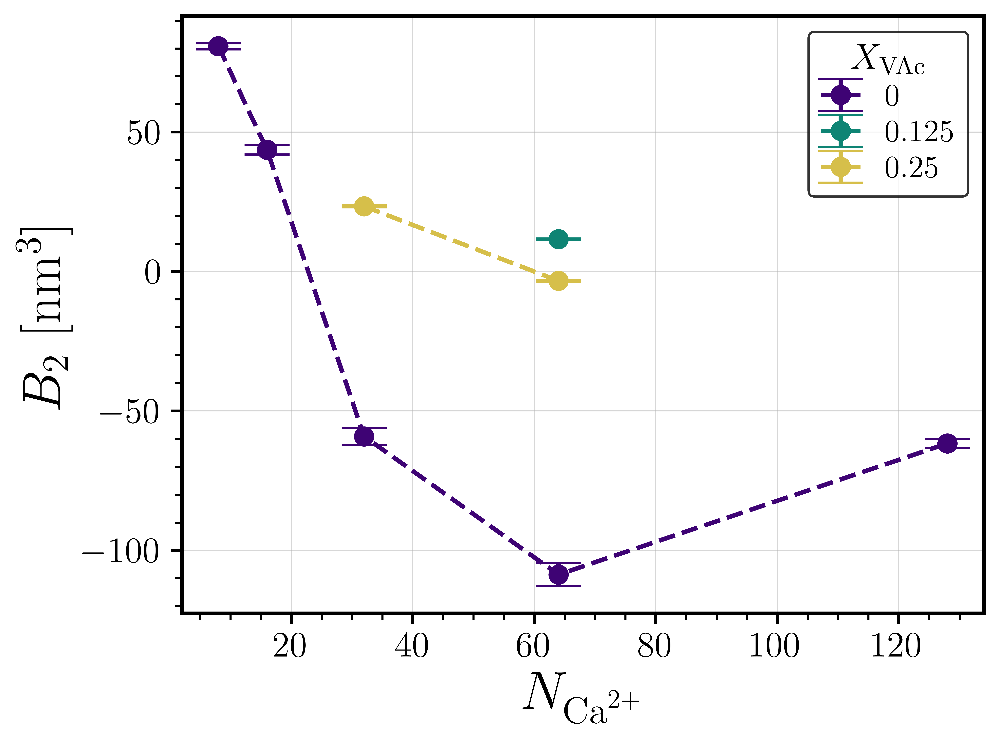

In [33]:
cmap = cmr.take_cmap_colors("cmr.rainforest", N=3, cmap_range=(0.20, 0.80))

# plot of B2 vs number of Ca ions
print("Plotting B2 vs number of Ca ions...")
fig_ca = plt.figure(dpi=1200)
ax_ca = fig_ca.add_subplot(111)
ax_ca.grid(visible=True, which="major",
           linestyle="-", linewidth=0.5, alpha=0.5)

# add horizontal line at y=0
# ax_ca.hlines(0, 0, 132, linestyle="-", color="k", alpha=0.9)

# plot B2 vs number of Ca ions for homopolymer
df = df_b2_homopolymer.loc[(df_b2_homopolymer["perc_vac"] == 0.) & (df_b2_homopolymer["nCa"] > 0)].copy()
print(f" - Number of homopolymer data points: {len(df)}")
ax_ca.errorbar(df["nCa"], df["b2"], yerr=z_score*df["b2_err"],
               linestyle="--", fmt="o", markersize=8, capsize=10,
               color=cmap[0], label="0")
multiple = False

# plot B2 vs number of Ca ions for 0.125 
try:
    df = df_b2_copolymer.loc[(df_b2_copolymer["perc_vac"] == 0.125) & (df_b2_copolymer["nCa"] > 0)].copy()
    print(f" - Number of 12.5% copolymer data points: {len(df)}")
    ax_ca.errorbar(df["nCa"], df["b2"], yerr=z_score*df["b2_err"],
                linestyle="--", fmt="o", markersize=8, capsize=10,
                color=cmap[1], label="0.125")
    multiple = True
except NameError:
    pass

# plot B2 vs number of Ca ions for 0.25
try:
    df = df_b2_copolymer.loc[(df_b2_copolymer["perc_vac"] == 0.25) & (df_b2_copolymer["nCa"] > 0)].copy()
    print(f" - Number of 25% copolymer data points: {len(df)}")
    ax_ca.errorbar(df["nCa"], df["b2"], yerr=z_score*df["b2_err"],
                linestyle="--", fmt="o", markersize=8, capsize=10,
                color=cmap[2], label="0.25")
    multiple = True
except NameError:
    pass


# plot elements
ax_ca.set_xlabel(r"$N_{\mathrm{Ca}^{2+}}$")
ax_ca.set_ylabel(r"$B_2$ [nm$^3$]")
if multiple:
    ax_ca.legend(loc="best", title=r"$X_{\mathrm{VAc}}$", ncol=1)
ax_ca.set_title(r"PAA 16-mer $B_2$ vs. $N_{\mathrm{Ca}^{2+}}$", y=1.03)
fig_ca.tight_layout()

# save figure
fig_ca.savefig(dir_figures / "b2_vs_nca_paa.png", transparent=True, dpi=600)

# remove title and save as PDF
ax_ca.set_title("")
fig_ca.tight_layout()
fig_ca.savefig(dir_figures / "b2_vs_nca_paa.pdf", transparent=True, dpi=1200)


Plotting B2 vs number of Ca ions...
 - Number of homopolymer data points: 5
 - Number of other chemistry data points: 1
 - Number of other chemistry data points: 1


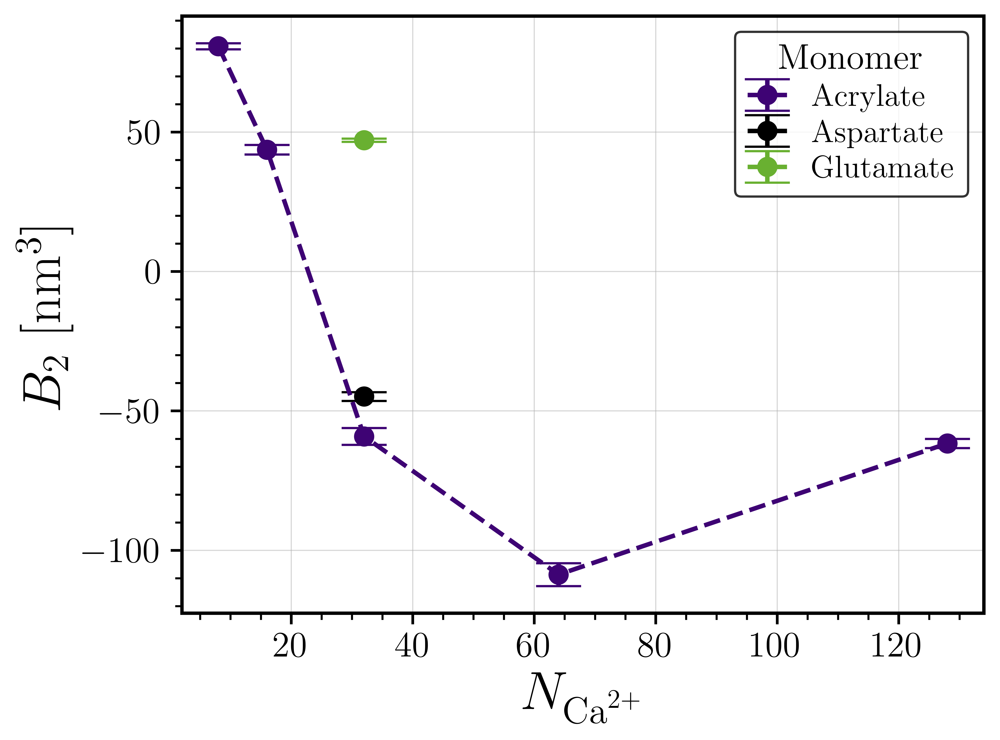

In [34]:
cmap = cmr.take_cmap_colors("cmr.rainforest", N=3, cmap_range=(0.20, 0.80))
cmap = [cmap[0], color_asp, color_glu]

# plot of B2 vs number of Ca ions
print("Plotting B2 vs number of Ca ions...")
fig_ca = plt.figure(dpi=1200)
ax_ca = fig_ca.add_subplot(111)
ax_ca.grid(visible=True, which="major",
           linestyle="-", linewidth=0.5, alpha=0.5)


# plot B2 vs number of Ca ions for homopolymer
df = df_b2_homopolymer.loc[(df_b2_homopolymer["perc_vac"] == 0.) & (df_b2_homopolymer["nCa"] > 0)].copy()
print(f" - Number of homopolymer data points: {len(df)}")
ax_ca.errorbar(df["nCa"], df["b2"], yerr=z_score*df["b2_err"],
               linestyle="--", fmt="o", markersize=8, capsize=10,
               color=cmap[0], label="Acrylate")
multiple = False

# plot B2 vs number of Ca ions for other chemistries
df = df_b2_chemistry.loc[(df_b2_chemistry["perc_vac"] == 0.) & (df_b2_chemistry["nCa"] > 0)].copy()
df = df[df["monomer"] == "Aspartate"].copy()
print(f" - Number of other chemistry data points: {len(df)}")
ax_ca.errorbar(df["nCa"], df["b2"], yerr=z_score*df["b2_err"],
                linestyle="--", fmt="o", markersize=8, capsize=10,
                color=cmap[1], label="Aspartate")

df = df_b2_chemistry.loc[(df_b2_chemistry["perc_vac"] == 0.) & (df_b2_chemistry["nCa"] > 0)].copy()
df = df[df["monomer"] == "Glutamate"].copy()
print(f" - Number of other chemistry data points: {len(df)}")
ax_ca.errorbar(df["nCa"], df["b2"], yerr=z_score*df["b2_err"],
                linestyle="--", fmt="o", markersize=8, capsize=10,
                color=cmap[2], label="Glutamate")


# plot elements
ax_ca.set_xlabel(r"$N_{\mathrm{Ca}^{2+}}$")
ax_ca.set_ylabel(r"$B_2$ [nm$^3$]")
ax_ca.legend(loc="best", title=r"Monomer", ncol=1)
fig_ca.tight_layout()

# save figure
fig_ca.savefig(dir_figures / "b2_vs_nca_chemistry.png", transparent=True, dpi=600)

# remove title and save as PDF
ax_ca.set_title("")
fig_ca.tight_layout()
fig_ca.savefig(dir_figures / "b2_vs_nca_chemistry.pdf", transparent=True, dpi=1200)


Plotting B2 vs number of Ca ions...
 - Number of homopolymer data points: 5
 - Number of 12.5% copolymer data points: 1
 - Number of 25% copolymer data points: 2
 - Number of other chemistry data points: 1
 - Number of other chemistry data points: 1


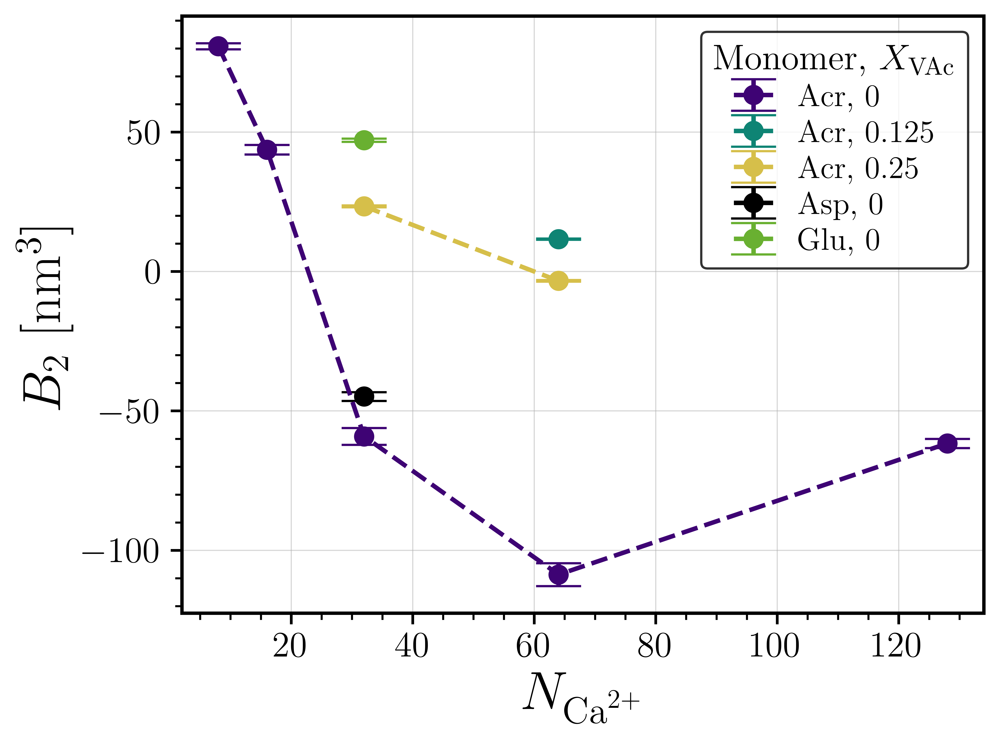

In [35]:
cmap = cmr.take_cmap_colors("cmr.rainforest", N=3, cmap_range=(0.20, 0.80))

# plot of B2 vs number of Ca ions
print("Plotting B2 vs number of Ca ions...")
fig_ca = plt.figure(dpi=1200)
ax_ca = fig_ca.add_subplot(111)
ax_ca.grid(visible=True, which="major",
           linestyle="-", linewidth=0.5, alpha=0.5)

# add horizontal line at y=0
# ax_ca.hlines(0, 0, 132, linestyle="-", color="k", alpha=0.9)

# plot B2 vs number of Ca ions for homopolymer
df = df_b2_homopolymer.loc[(df_b2_homopolymer["perc_vac"] == 0.) & (df_b2_homopolymer["nCa"] > 0)].copy()
print(f" - Number of homopolymer data points: {len(df)}")
ax_ca.errorbar(df["nCa"], df["b2"], yerr=z_score*df["b2_err"],
               linestyle="--", fmt="o", markersize=8, capsize=10,
               color=cmap[0], label="Acr, 0")
multiple = False

# plot B2 vs number of Ca ions for 0.125 
try:
    df = df_b2_copolymer.loc[(df_b2_copolymer["perc_vac"] == 0.125) & (df_b2_copolymer["nCa"] > 0)].copy()
    print(f" - Number of 12.5% copolymer data points: {len(df)}")
    ax_ca.errorbar(df["nCa"], df["b2"], yerr=z_score*df["b2_err"],
                linestyle="--", fmt="o", markersize=8, capsize=10,
                color=cmap[1], label="Acr, 0.125")
    multiple = True
except NameError:
    pass

# plot B2 vs number of Ca ions for 0.25
try:
    df = df_b2_copolymer.loc[(df_b2_copolymer["perc_vac"] == 0.25) & (df_b2_copolymer["nCa"] > 0)].copy()
    print(f" - Number of 25% copolymer data points: {len(df)}")
    ax_ca.errorbar(df["nCa"], df["b2"], yerr=z_score*df["b2_err"],
                linestyle="--", fmt="o", markersize=8, capsize=10,
                color=cmap[2], label="Acr, 0.25")
    multiple = True
except NameError:
    pass

# plot B2 vs number of Ca ions for other chemistries
df = df_b2_chemistry.loc[(df_b2_chemistry["perc_vac"] == 0.) & (df_b2_chemistry["nCa"] > 0)].copy()
df = df[df["monomer"] == "Aspartate"].copy()
print(f" - Number of other chemistry data points: {len(df)}")
ax_ca.errorbar(df["nCa"], df["b2"], yerr=z_score*df["b2_err"],
                linestyle="--", fmt="o", markersize=8, capsize=10,
                color=color_asp, label="Asp, 0")

df = df_b2_chemistry.loc[(df_b2_chemistry["perc_vac"] == 0.) & (df_b2_chemistry["nCa"] > 0)].copy()
df = df[df["monomer"] == "Glutamate"].copy()
print(f" - Number of other chemistry data points: {len(df)}")
ax_ca.errorbar(df["nCa"], df["b2"], yerr=z_score*df["b2_err"],
                linestyle="--", fmt="o", markersize=8, capsize=10,
                color=color_glu, label="Glu, 0")

# plot elements
ax_ca.set_xlabel(r"$N_{\mathrm{Ca}^{2+}}$")
ax_ca.set_ylabel(r"$B_2$ [nm$^3$]")
if multiple:
    ax_ca.legend(loc="best", title=r"Monomer, $X_{\mathrm{VAc}}$", ncol=1)
ax_ca.set_title(r"PAA 16-mer $B_2$ vs. $N_{\mathrm{Ca}^{2+}}$", y=1.03)
fig_ca.tight_layout()

# save figure
fig_ca.savefig(dir_figures / "b2_vs_nca_all.png", transparent=True, dpi=600)

# remove title and save as PDF
ax_ca.set_title("")
fig_ca.tight_layout()
fig_ca.savefig(dir_figures / "b2_vs_nca_all.pdf", transparent=True, dpi=1200)


Plotting B2 vs number of bound Ca ions...
 - Number of homopolymer data points: 5


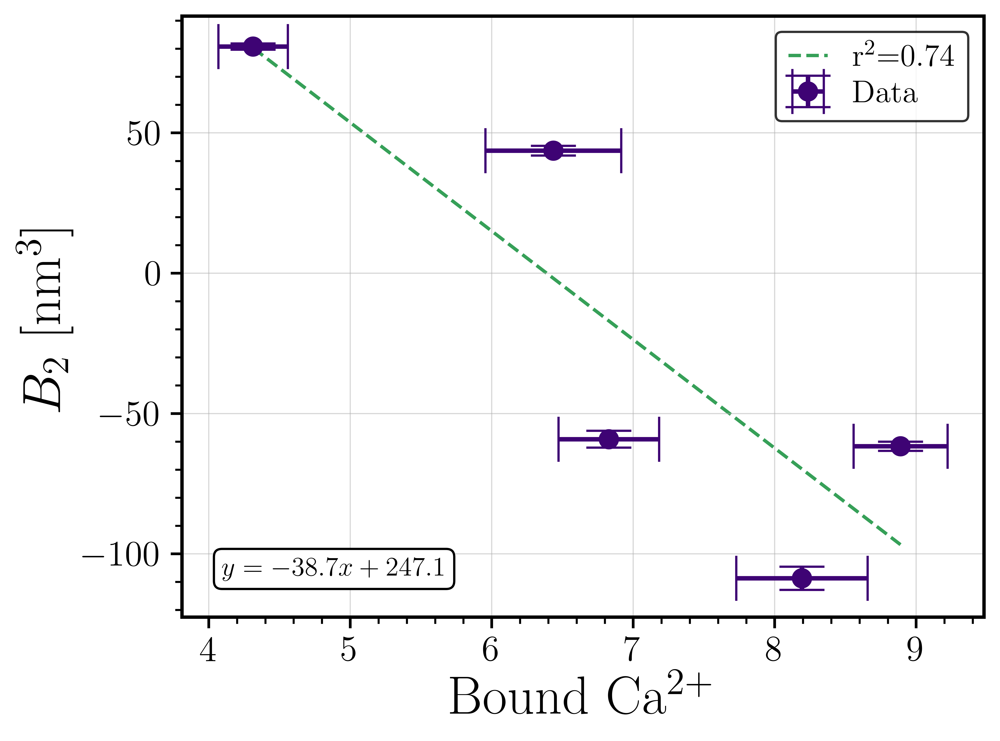

In [36]:
cmap = cmr.take_cmap_colors("cmr.rainforest", N=3, cmap_range=(0.20, 0.60))

# get data on number of bound Ca ions
df_ca = pd.read_parquet("/media/aglisman/Linux_Overflow/home/aglisman/VSCodeProjects/Gromacs-Data-Analysis/analysis/16-paper-2chain-analysis/data/output_mdanalysis_cvs/all_states/data/n_ca_bound.parquet")
df_ca = df_ca.loc[df_ca["n_ca_bound"] > 0].copy()
x, xerr = df_ca["n_ca_bound"], df_ca["n_ca_bound_err"]

# plot of B2 vs number of Ca ions
print("Plotting B2 vs number of bound Ca ions...")
fig_ca = plt.figure(dpi=1200)
ax_ca = fig_ca.add_subplot(111)
ax_ca.grid(visible=True, which="major",
           linestyle="-", linewidth=0.5, alpha=0.5)

# plot B2 vs number of Ca ions for homopolymer
df = df_b2_homopolymer.loc[(df_b2_homopolymer["perc_vac"] == 0.) & (df_b2_homopolymer["nCa"] > 0)].copy()
y, yerr = df["b2"], df["b2_err"]
print(f" - Number of homopolymer data points: {len(df)}")
ax_ca.errorbar(x, y, yerr=z_score*yerr, xerr=z_score*xerr,
               linestyle="", fmt="o", markersize=8, capsize=10,
               zorder=1,
               color=cmap[0], label="Data")

# best fit line 
slope, intercept, r_value, p_value, std_err = stats.linregress(x, y)

# plot best fit line
ax_ca.plot(x, intercept + slope*x, 
           linestyle="--", linewidth=1.5, color=cmap[2], 
           zorder=0,
           label=f"r$^2$={r_value**2:.2f}")

# add textbox with linear equation
ax_ca.text(0.05, 0.10, f"$y = {slope:.1f}x + {intercept:.1f}$",
        transform=ax_ca.transAxes, fontsize=12, verticalalignment="top",
        bbox=dict(boxstyle="round", facecolor="white", alpha=1.0))

# plot elements
ax_ca.set_xlabel(r"Bound Ca$^{2+}$")
ax_ca.set_ylabel(r"$B_2$ [nm$^3$]")
ax_ca.legend(loc="upper right", ncol=1)
ax_ca.set_title(r"PAA 16-mer $B_2$ vs. $N_{\mathrm{Ca}^{2+}}$", y=1.03)
fig_ca.tight_layout()

# save figure
fig_ca.savefig(dir_figures / "b2_vs_nca_bound_paa_homopolymer.png", transparent=True, dpi=600)

# remove title and save as PDF
ax_ca.set_title("")
fig_ca.tight_layout()
fig_ca.savefig(dir_figures / "b2_vs_nca_bound_paa_homopolymer.pdf", transparent=True, dpi=1200)


Plotting rho vs number of Ca ions...
 - Number of homopolymer data points: 3
 - Number of 12.5% copolymer data points: 0
 - Number of 25% copolymer data points: 1


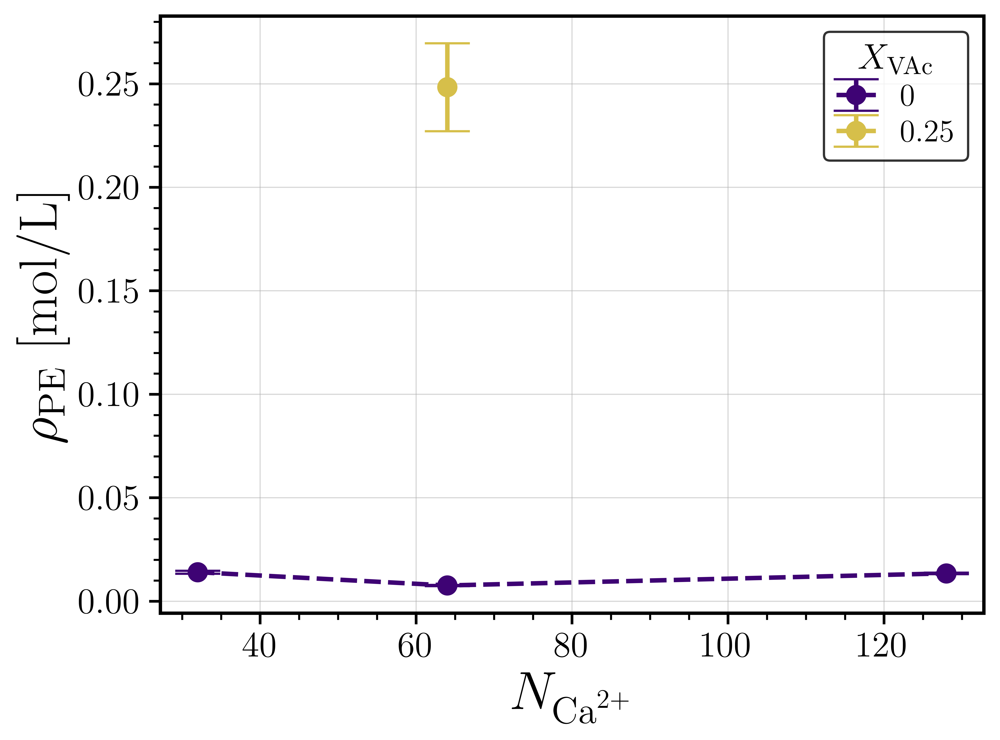

In [37]:
cmap = cmr.take_cmap_colors("cmr.rainforest", N=3, cmap_range=(0.20, 0.80))

# plot of B2 vs number of Ca ions
print("Plotting rho vs number of Ca ions...")
fig_rho = plt.figure(dpi=1200)
ax_rho = fig_rho.add_subplot(111)
ax_rho.grid(visible=True, which="major",
           linestyle="-", linewidth=0.5, alpha=0.5)

# add horizontal line at y=0
# ax_rho.hlines(0, 0, 132, linestyle="-", color="k", alpha=0.9)

# plot B2 vs number of Ca ions for homopolymer
df = df_b2_homopolymer.loc[(df_b2_homopolymer["perc_vac"] == 0.) & (df_b2_homopolymer["rho"] > 0)].copy()
print(f" - Number of homopolymer data points: {len(df)}")
ax_rho.errorbar(df["nCa"], df["rho"], yerr=z_score*df["rho_err"],
               linestyle="--", fmt="o", markersize=8, capsize=10,
               color=cmap[0], label="0")
multiple = False

# plot B2 vs number of Ca ions for 0.125 
try:
    df = df_b2_copolymer.loc[(df_b2_copolymer["perc_vac"] == 0.125) & (df_b2_copolymer["rho"] > 0)].copy()
    print(f" - Number of 12.5% copolymer data points: {len(df)}")
    if len(df) > 0:
        ax_rho.errorbar(df["nCa"], df["rho"], yerr=z_score*df["rho_err"],
                linestyle="--", fmt="o", markersize=8, capsize=10,
                color=cmap[1], label="0.125")
        multiple = True
except NameError:
    pass

# plot B2 vs number of Ca ions for 0.25
try:
    df = df_b2_copolymer.loc[(df_b2_copolymer["perc_vac"] == 0.25) & (df_b2_copolymer["rho"] > 0)].copy()
    print(f" - Number of 25% copolymer data points: {len(df)}")
    if len(df) > 0:
        ax_rho.errorbar(df["nCa"], df["rho"], yerr=z_score*df["rho_err"],
                linestyle="--", fmt="o", markersize=8, capsize=10,
                color=cmap[2], label="0.25")
        multiple = True
except NameError:
    pass

# plot formatting
ax_rho.set_xlabel(r"$N_{\mathrm{Ca}^{2+}}$")
ax_rho.set_ylabel(r"$\rho_{\mathrm{PE}}$ [mol/L]")
# ax_rho.set_yticks([0.2, 0.4, 0.6, 0.8, 1.0])
if multiple:
    ax_rho.legend(loc="best", title=r"$X_{\mathrm{VAc}}$", ncol=1)
ax_rho.set_title(
    r"PAA 16-mer $\rho_{\mathrm{PE}}$ vs. $N_{\mathrm{Ca}^{2+}}$", y=1.03)
fig_rho.tight_layout()

# save figure
fig_rho.savefig(dir_figures / "rho_vs_nca_copolymer.png")

# remove title and save as PDF
ax_rho.set_title("")
fig_rho.tight_layout()
fig_rho.savefig(dir_figures / "rho_vs_nca_copolymer.pdf", transparent=True, dpi=1200)


Plotting rho vs number of Ca ions...
 - Number of homopolymer data points: 3


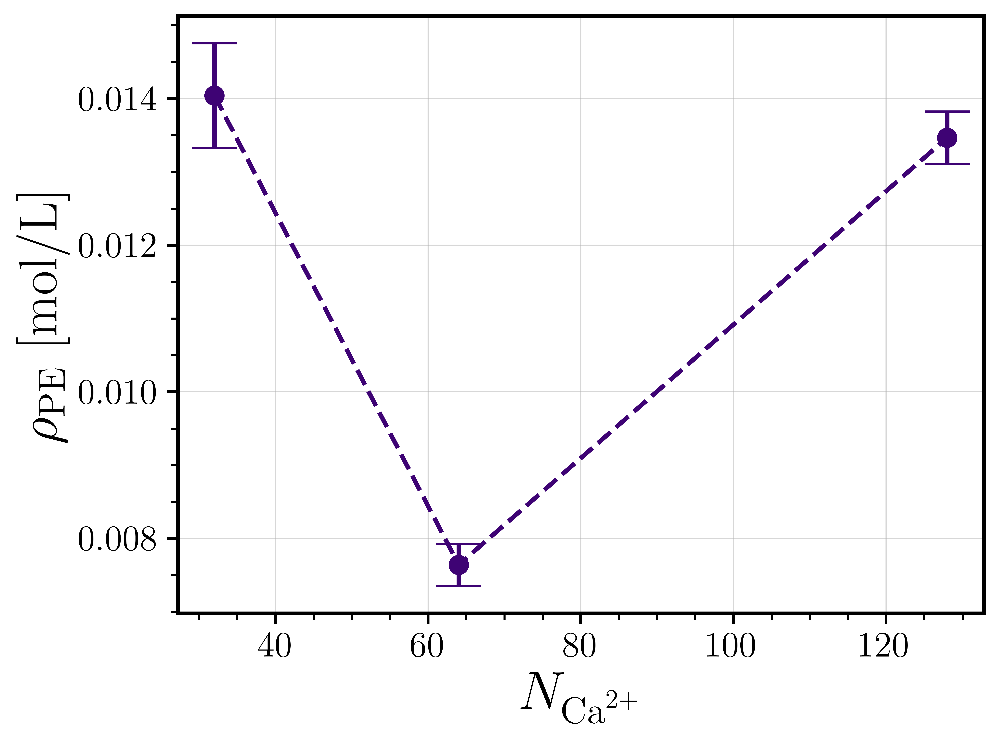

In [38]:
cmap = cmr.take_cmap_colors("cmr.rainforest", N=3, cmap_range=(0.20, 0.80))

# plot of B2 vs number of Ca ions
print("Plotting rho vs number of Ca ions...")
fig_rho = plt.figure(dpi=1200)
ax_rho = fig_rho.add_subplot(111)
ax_rho.grid(visible=True, which="major",
           linestyle="-", linewidth=0.5, alpha=0.5)

# add horizontal line at y=0
# ax_rho.hlines(0, 0, 132, linestyle="-", color="k", alpha=0.9)

# plot B2 vs number of Ca ions for homopolymer
df = df_b2_homopolymer.loc[(df_b2_homopolymer["perc_vac"] == 0.) & (df_b2_homopolymer["rho"] > 0)].copy()
print(f" - Number of homopolymer data points: {len(df)}")
ax_rho.errorbar(df["nCa"], df["rho"], yerr=z_score*df["rho_err"],
               linestyle="--", fmt="o", markersize=8, capsize=10,
               color=cmap[0], label="0")


# plot formatting
ax_rho.set_xlabel(r"$N_{\mathrm{Ca}^{2+}}$")
ax_rho.set_ylabel(r"$\rho_{\mathrm{PE}}$ [mol/L]")
# ax_rho.set_yticks([0.2, 0.4, 0.6, 0.8, 1.0])
ax_rho.set_title(
    r"PAA 16-mer $\rho_{\mathrm{PE}}$ vs. $N_{\mathrm{Ca}^{2+}}$", y=1.03)
fig_rho.tight_layout()

# save figure
fig_rho.savefig(dir_figures / "rho_vs_nca_homopolymer.png")

# remove title and save as PDF
ax_rho.set_title("")
fig_rho.tight_layout()
fig_rho.savefig(dir_figures / "rho_vs_nca_homopolymer.pdf", transparent=True, dpi=1200)
fig_rho.savefig(dir_figures / "rho_vs_nca_homopolymer_notransparent.pdf", transparent=False, dpi=1200)
